In [2]:
pip install opencv-python cv2


Note: you may need to restart the kernel to use updated packages.


ERROR: Could not find a version that satisfies the requirement cv2 (from versions: none)
ERROR: No matching distribution found for cv2


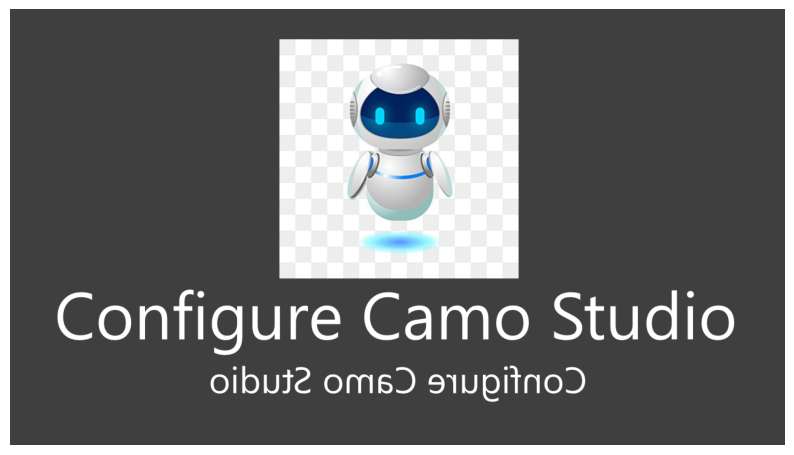

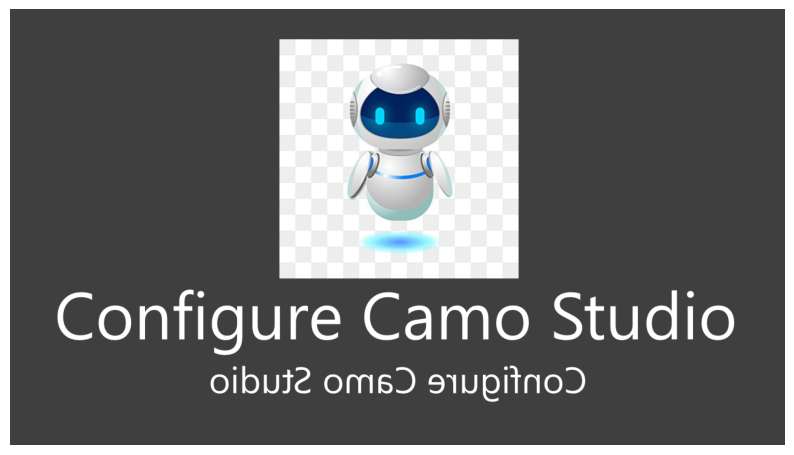

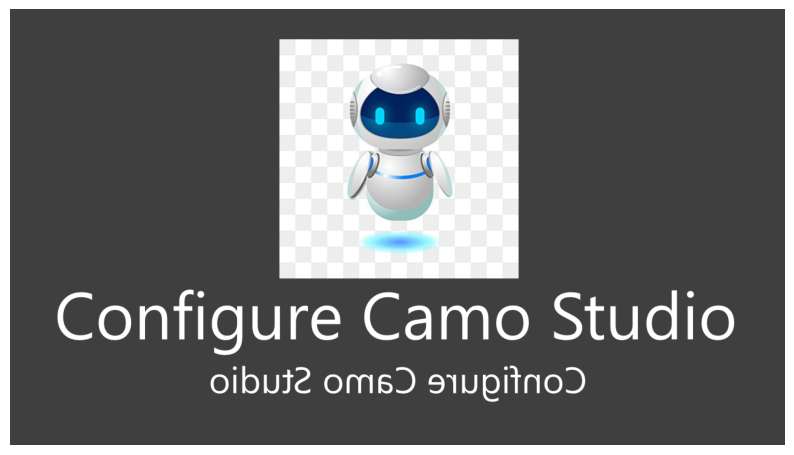

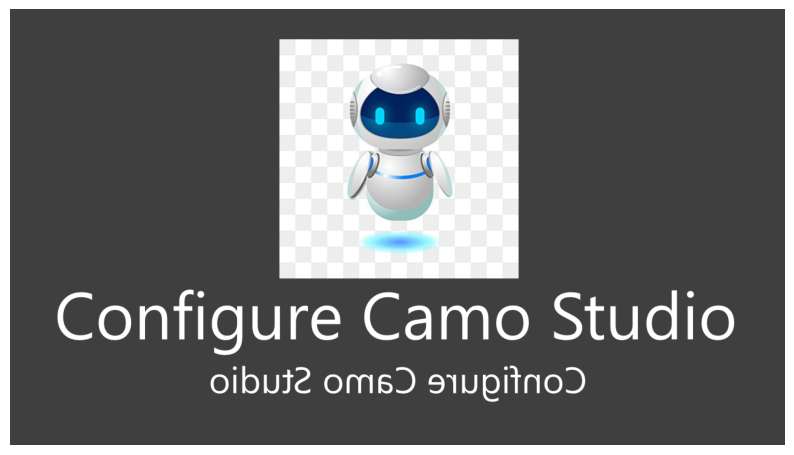

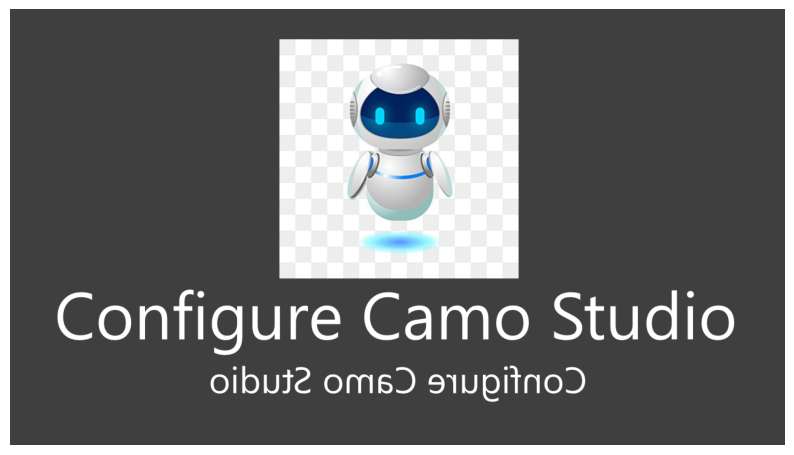

...

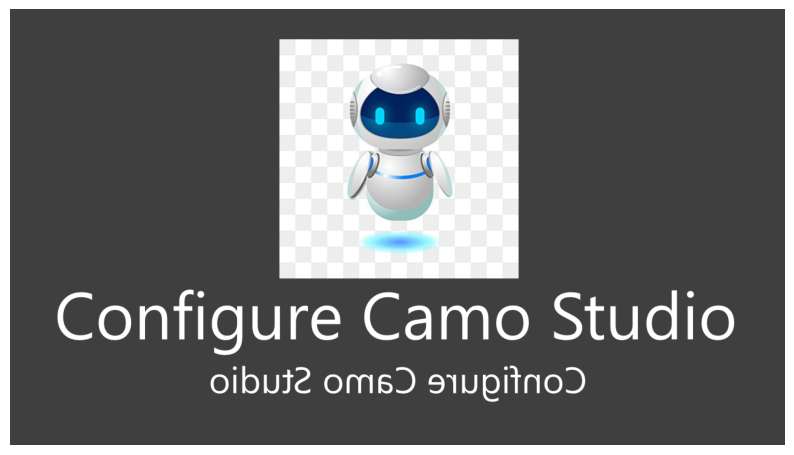

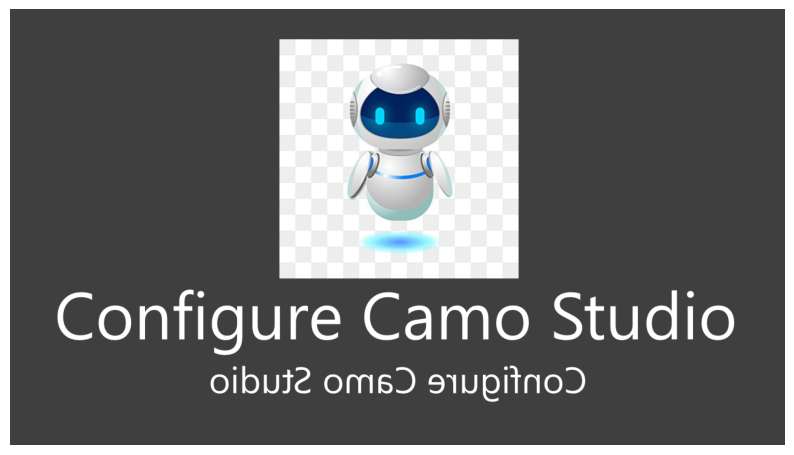

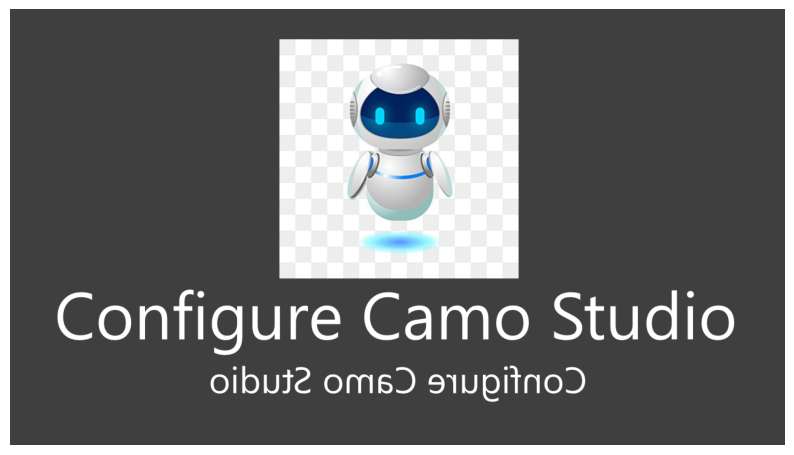

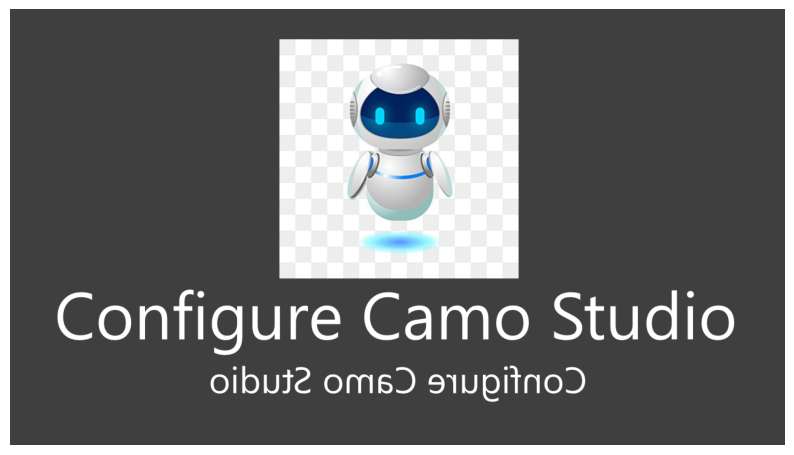

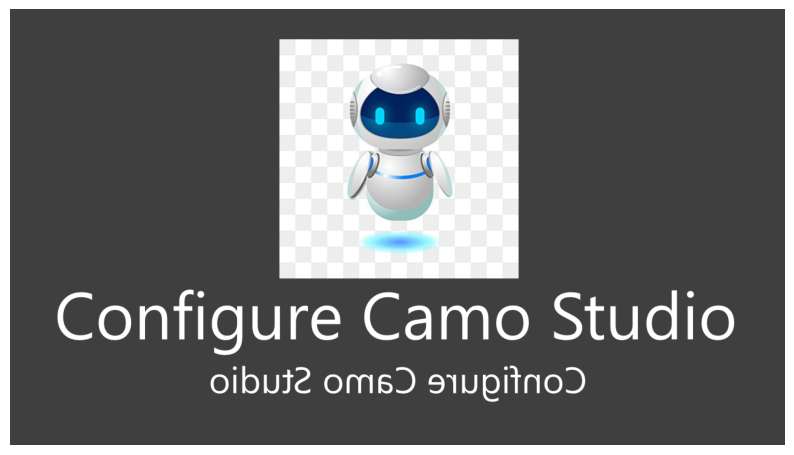

KeyboardInterrupt: 

In [5]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

# Cargar el clasificador de cascada para detección de rostros
face_cascade = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')

# Cargar el avatar
avatar_image = cv2.imread('avatar.png')

# Función para mostrar imágenes en el notebook
def show_image(image):
    plt.figure(figsize=(10, 8))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

# Función para reemplazar rostros por avatares en tiempo real
def replace_faces_with_avatars():
    # Capturar video de la cámara web
    video_capture = cv2.VideoCapture(0)

    while True:
        # Leer el siguiente frame del video
        ret, frame = video_capture.read()

        # Convertir el frame a escala de grises
        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

        # Detectar rostros en el frame
        faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5, minSize=(30, 30))

        # Iterar sobre los rostros detectados y reemplazarlos por el avatar
        for (x, y, w, h) in faces:
            # Redimensionar el avatar para que coincida con el tamaño del rostro detectado
            resized_avatar = cv2.resize(avatar_image, (w, h))

            # Reemplazar el rostro con el avatar
            frame[y:y+h, x:x+w] = resized_avatar

        # Mostrar el resultado en el notebook
        show_image(frame)

        # Salir del bucle si se presiona la tecla 'q'
        if cv2.waitKey(1) & 0xFF == ord('q'):
            break

    # Liberar los recursos
    video_capture.release()
    cv2.destroyAllWindows()

# Ejecutar la función para reemplazar rostros por avatares en tiempo real
replace_faces_with_avatars()


In [10]:
import cv2

def show_camera():
    # Capturar video de la cámara web
    video_capture = cv2.VideoCapture(0)

    while True:
        # Leer el siguiente frame de la cámara
        ret, frame = video_capture.read()

        # Mostrar el frame en una ventanaq
        cv2.imshow('Cámara', frame)

        # Salir del bucle si se presiona la tecla 'q'
        if cv2.waitKey(1) & 0xFF == ord('q'):
            break

    # Liberar los recursos
    video_capture.release()
    cv2.destroyAllWindows()

# Ejecutar la función para mostrar la transmisión de la cámara
show_camera()



KeyboardInterrupt: 

In [13]:
import numpy as np
import cv2
import time

camara = cv2.VideoCapture("test.mp4")
fondo = None

while True:
    grabbed, frame = camara.read()
    if not grabbed:
        break

    gris = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    gris = cv2.GaussianBlur(gris, (21, 21), 0)

    if fondo is None:
        fondo = gris
        continue

    resta = cv2.absdiff(fondo, gris)
    umbral = cv2.threshold(resta, 25, 255, cv2.THRESH_BINARY)[1]
    umbral = cv2.dilate(umbral, None, iterations=2)
    contornosimg = umbral.copy()

    contornos, hierarchy = cv2.findContours(contornosimg, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

    for c in contornos:
        if cv2.contourArea(c) < 500:
            continue
        (x, y, w, h) = cv2.boundingRect(c)
        cv2.rectangle(frame, (x, y), (x + w, y + h), (0, 255, 0), 2)

    cv2.imshow("Camara", frame)
    cv2.imshow("Umbral", umbral)
    cv2.imshow("Resta", resta)
    cv2.imshow("Contorno", contornosimg)

    key = cv2.waitKey(1) & 0xFF
    time.sleep(0.015)

    if key == ord("s"):
        break

camara.release()
cv2.destroyAllWindows()
